In [3]:
# Import necessary libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
from utils import *
from harris import harris

Images loaded successfully!
Images loaded successfully!
Images loaded successfully!


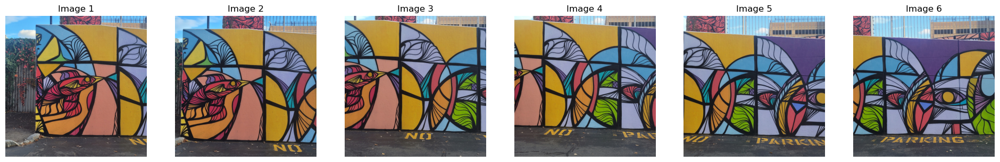

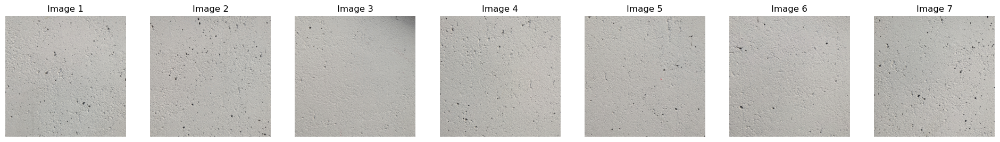

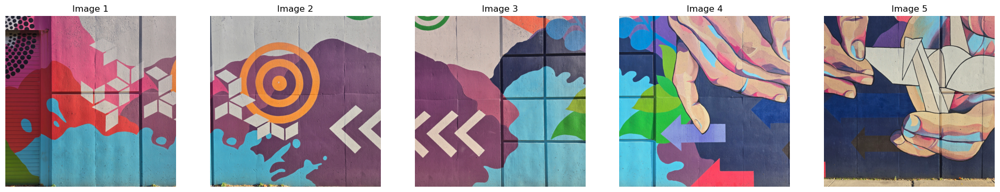

In [5]:
# Load and Display Images
path = "C:\\Users\\ragsh\\Desktop\\FALL 24\\RSN\\LAB5\\data"
path_conc = "C:\\Users\\ragsh\\Desktop\\FALL 24\\RSN\\LAB5\\data-2"
path_mural = "C:\\Users\\ragsh\\Desktop\\FALL 24\\RSN\\LAB5\\data-3"
images = load_images(path) # Loads images into an array
images_conc = load_images(path_conc)
images_mural = load_images(path_mural)

In [7]:
def detect_and_compute_keypoints(img):
    """
    Detect keypoints and compute descriptors for each image using SIFT.
    """
    keypoints = []
    descriptors = []
    grayscale = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    ys, xs, resp = harris(grayscale, 500)

    kp = [cv2.KeyPoint(float(x), float(y), 5) for y, x in zip(ys, xs)]
    
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.compute(grayscale, kp)

    return keypoints, descriptors

In [17]:
def stitch_images(img1, img2, kp1, kp2, matches):
    """
    Stitch two images together using matched keypoints and RANSAC to find homography.
    This version adds padding based on detected alignment (left or right).
    """
    # Extract matched keypoints
    img1_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    img2_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    
    # Compute homography matrix using RANSAC
    H, mask = cv2.findHomography(img1_pts, img2_pts, cv2.RANSAC, 8.0)
    img1_warped, img2_padded = warpPerspectivePadded(img1, img2, H)
    stitched_image = masking(img1_warped, img2_padded, 0.5)
    result = np.uint8(stitched_image)
    
    return result

In [19]:
def create_panorama(images):
    """
    Create a panorama from a list of images.
    """
    stitched_image = images[0]  # Start with the first image
    for i in range(1, len(images)):
        print(f"Stitching image {i-1} and {i}...")
        keypoints1, descriptors1 = detect_and_compute_keypoints(stitched_image)
        keypoints2, descriptors2 = detect_and_compute_keypoints(images[i])
        
        # Match features
        matches = match_features(descriptors1, descriptors2)
        print(f"Number of good matches between stitched image and image {i}: {len(matches)}")

        draw_matches(stitched_image, images[i], keypoints1, keypoints2, matches, num_matches=30)
        
        # Stitch the current pair of images
        stitched_image = stitch_images(stitched_image, images[i], keypoints1, keypoints2, matches)
    
    return stitched_image

In [21]:
def display_pano(panorama):
    # Display the final panorama
    plt.figure(figsize=(15, 10))
    plt.imshow(panorama)
    plt.title("Panorama Image")
    plt.axis("off")
    plt.show()

Stitching image 0 and 1...
Number of good matches between stitched image and image 1: 224


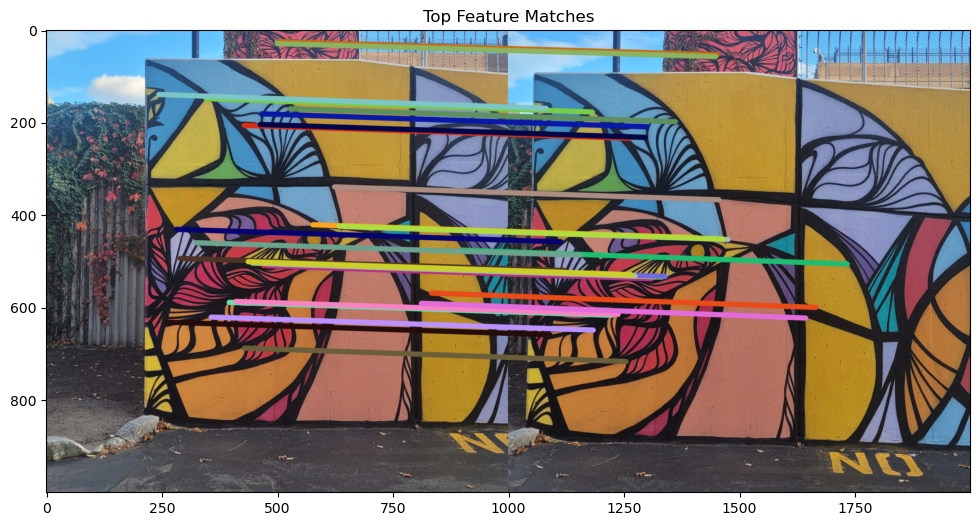

Stitching image 1 and 2...
Number of good matches between stitched image and image 2: 134


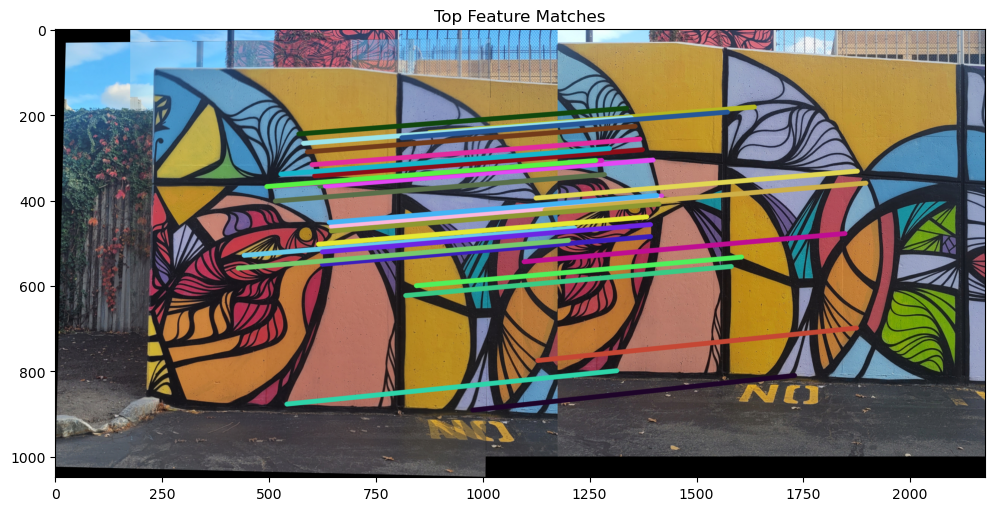

Stitching image 2 and 3...
Number of good matches between stitched image and image 3: 203


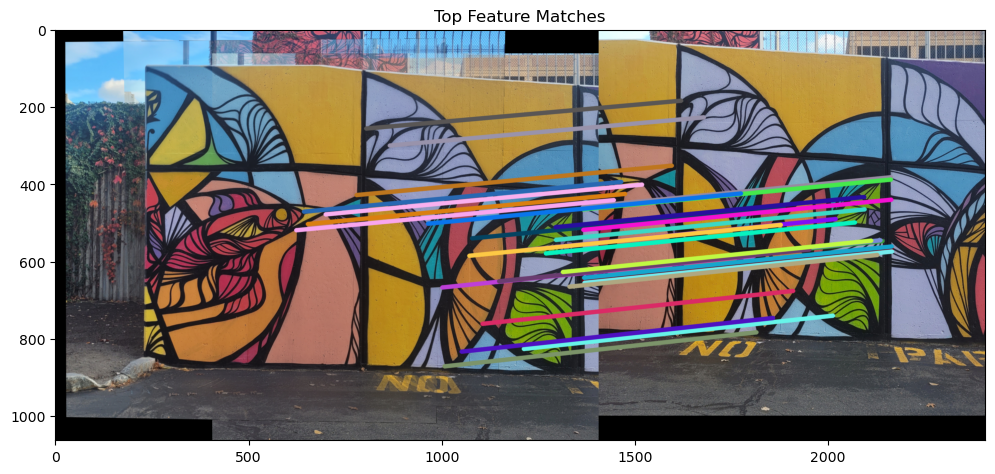

Stitching image 3 and 4...
Number of good matches between stitched image and image 4: 187


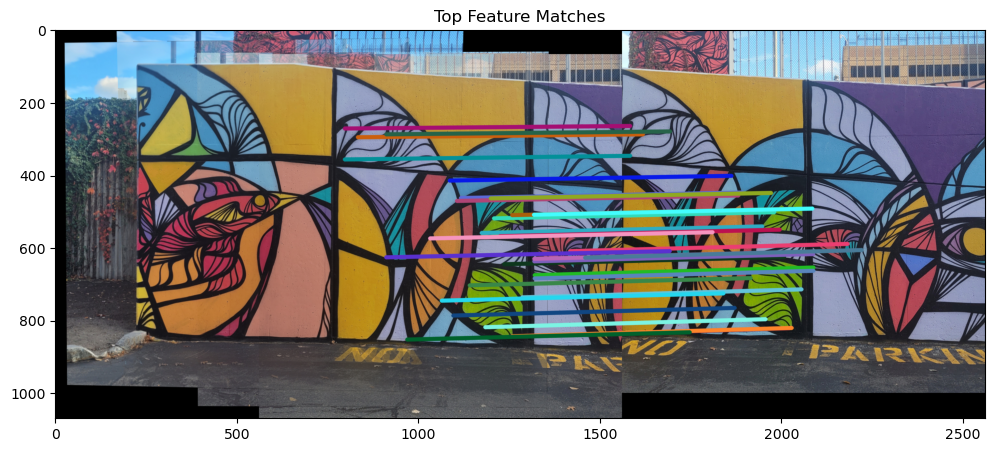

Stitching image 4 and 5...
Number of good matches between stitched image and image 5: 189


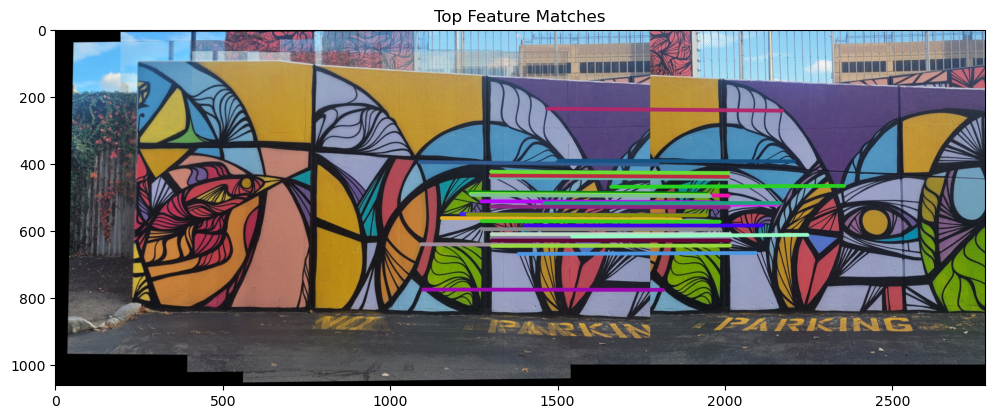

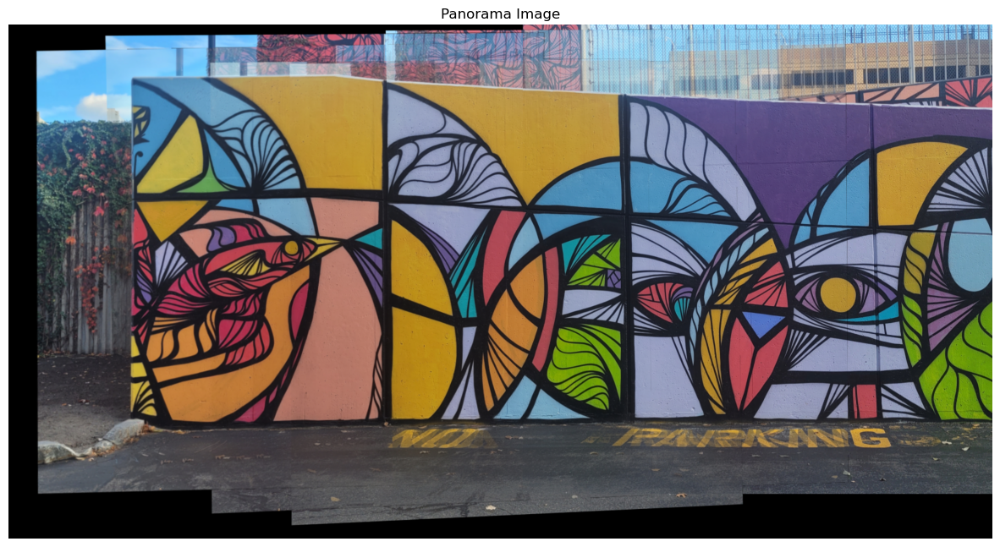

Stitching image 0 and 1...
Number of good matches between stitched image and image 1: 48


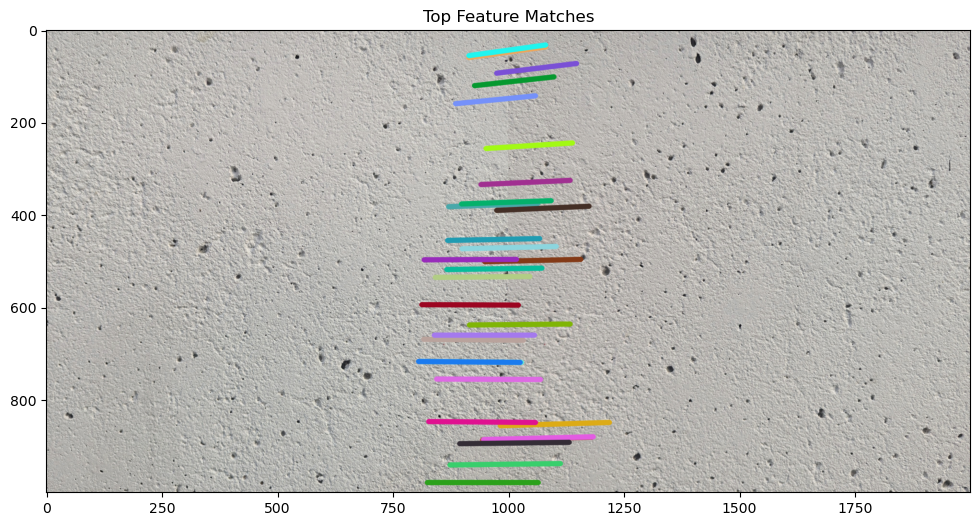

Stitching image 1 and 2...
Number of good matches between stitched image and image 2: 0


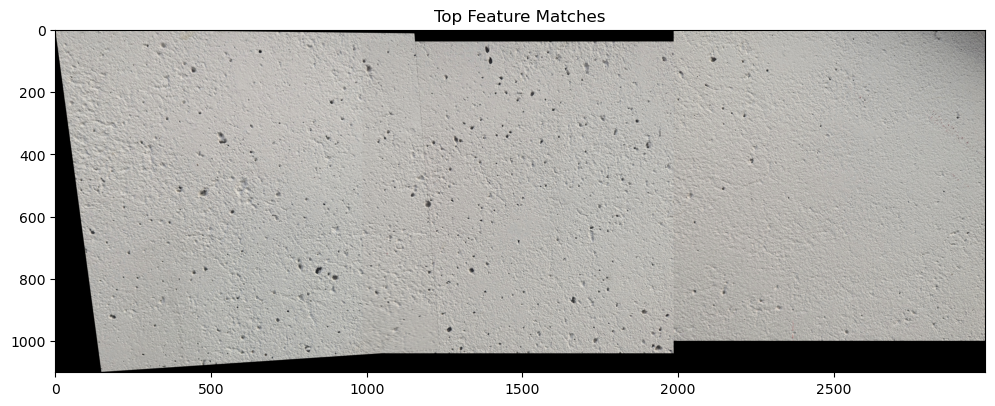

error: OpenCV(4.10.0) D:\bld\libopencv_1727758951658\work\modules\calib3d\src\fundam.cpp:390: error: (-28:Unknown error code -28) The input arrays should have at least 4 corresponding point sets to calculate Homography in function 'cv::findHomography'


In [23]:
panorama = create_panorama(images)
display_pano(panorama)
panorama_conc = create_panorama(images_conc)
display_pano(panorama_conc)
panorama_mural = create_panorama(images_mural)
display_pano(panorama_mural)


Changes made:

Harris Corner Paramters tuned:
- RANSAC Reproj Threshold
- Masking Alpha
- Maximum # Interest points in Harris Corner Detection
- Keypoint size
- Gaussian Smoothing Mask Size
- Gaussian Filter Standard Deviation
- Minimum allowable response threshold

Code Changes:
- Images Loaded at 1000x1000
- Defined display_pano function to be used for each panorama case